# DBSCAN Lab
In this notebook, we will use DBSCAN to cluster a couple of datasests. We will examine how changing its parameters (epsilon and min_samples) changes the resulting cluster structure.

In [1]:
import pandas as pd
dataset_1 = pd.read_csv('blobs.csv')[:80].values

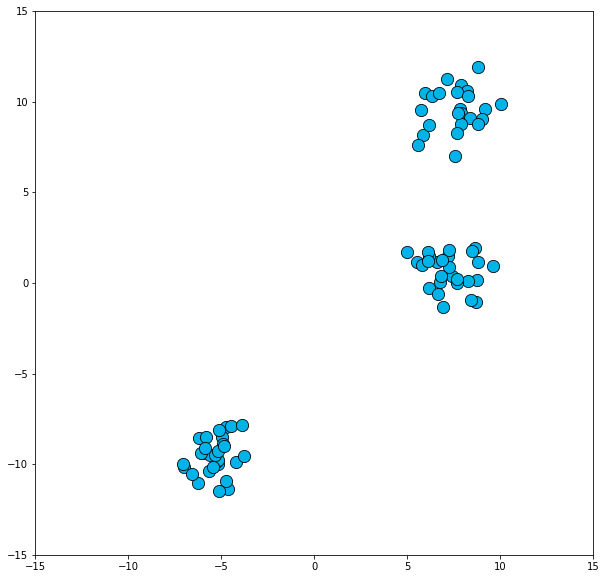

In [2]:
%matplotlib inline
import dbscan_lab_helper as helper

helper.plot_dataset(dataset_1)

Let's cluster it using DBSCAN's default settings and see what happens. We are hoping for it to be able to assign each of the three "blobs" into its own cluster. Can it do that out of the box?

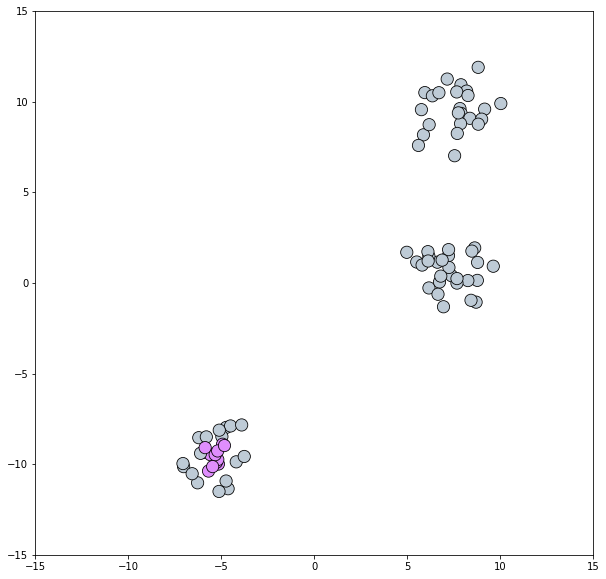

In [3]:
from sklearn.cluster import DBSCAN

dbscan = DBSCAN(eps=0.5, min_samples=5)
clustering_labels_1 = dbscan.fit_predict(dataset_1)

helper.plot_clustered_dataset(dataset_1, clustering_labels_1)

Does that look okay? Was it able to group the dataset into the three clusters we were hoping for?

As you see, we will have to make some tweaks. Let's start by looking at Epsilon, the radius of each point's neighborhood. The default value in sklearn is 0.5.

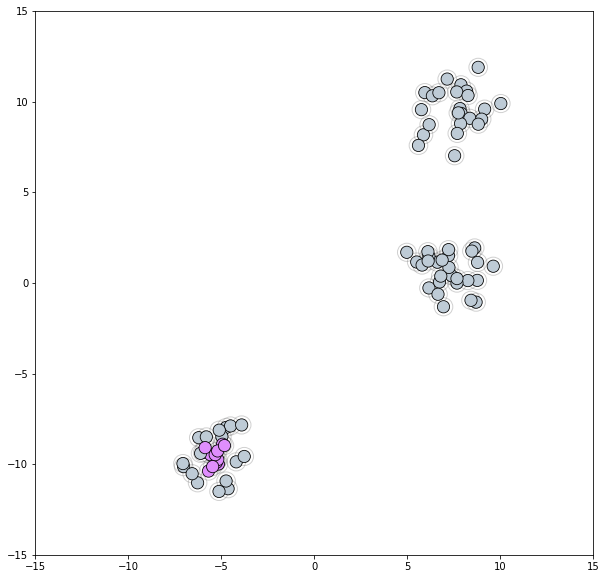

In [4]:
helper.plot_clustered_dataset(dataset_1, clustering_labels_1, neighborhood=True)

From the graph, we can see that an Epsilon value of 0.5 is too small for this dataset. We need to increase it so the points in a blob overlap each others' neighborhoods, but not to the degree where a single cluster would span two blobs.

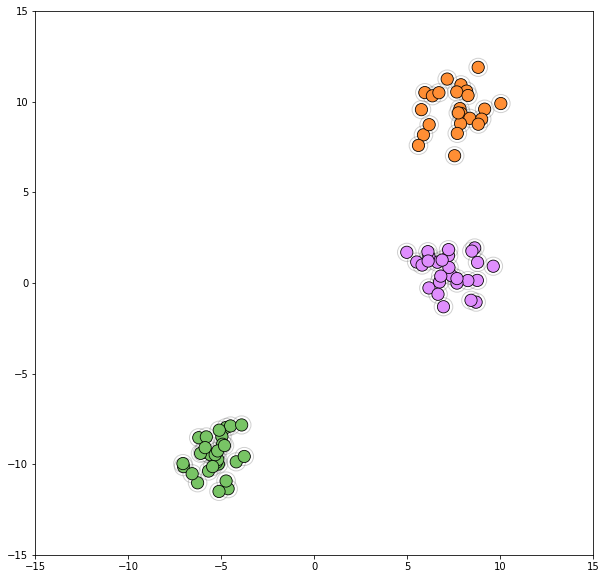

In [5]:
epsilon = 2

dbscan = DBSCAN(eps=epsilon)
clustering_labels_2 = dbscan.fit_predict(dataset_1)

helper.plot_clustered_dataset(dataset_1, clustering_labels_2, neighborhood=True)

## Dataset 2

Let's now look at a dataset that's a little more tricky

In [6]:
dataset_2 = pd.read_csv('varied.csv')[:300].values

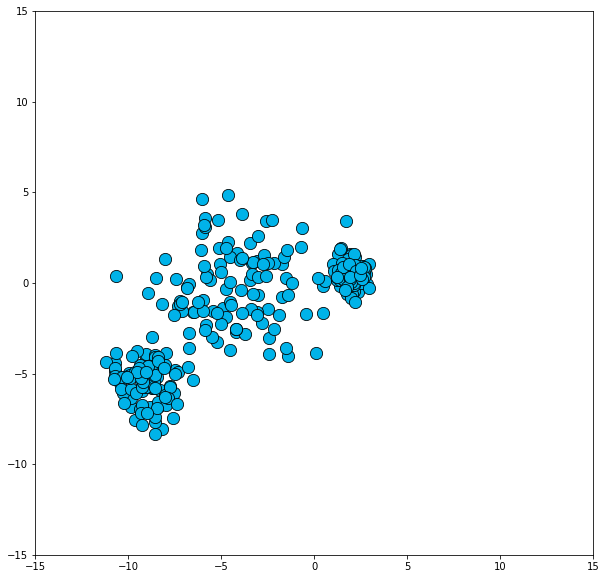

In [7]:
helper.plot_dataset(dataset_2)

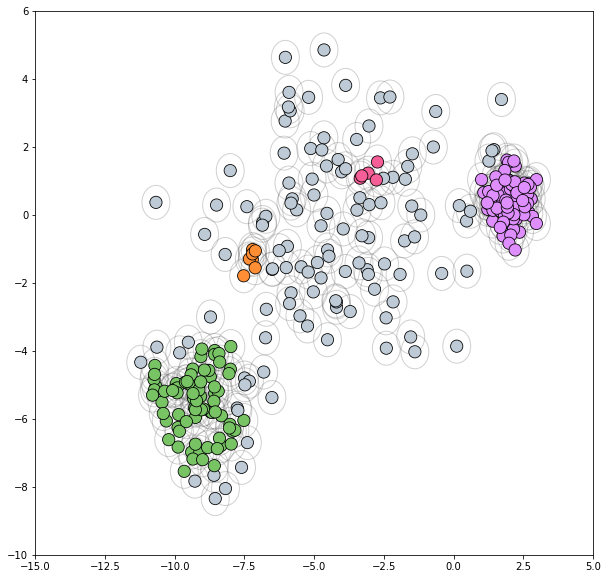

In [8]:
dbscan = DBSCAN()
clustering_labels_3 = dbscan.fit_predict(dataset_2)

helper.plot_clustered_dataset(dataset_2, clustering_labels_3, neighborhood=True, xlim=(-15, 5), ylim=(-10,6))

This clustering could make sense in some scenarios, but it seems rather arbitrary. Looking at the dataset, we can imagine at least two scenarios for what we'd want to do:
 * **Scenario** 1: Break the dataset up into three clusters: the blob on the left, the blob on the right, and the central area (even though it's less dense than the blobs on either side).
 * **Scenario 2**: Break the dataset up into two clusters: the blob on the left, and the blob on the right. Marking all the points in the center as noise. 
 
What values for the DBSCAN parameters would allow us to satisfy each of those senarios? Try a number of parameters to see if you can find a clustering that makes more sense.

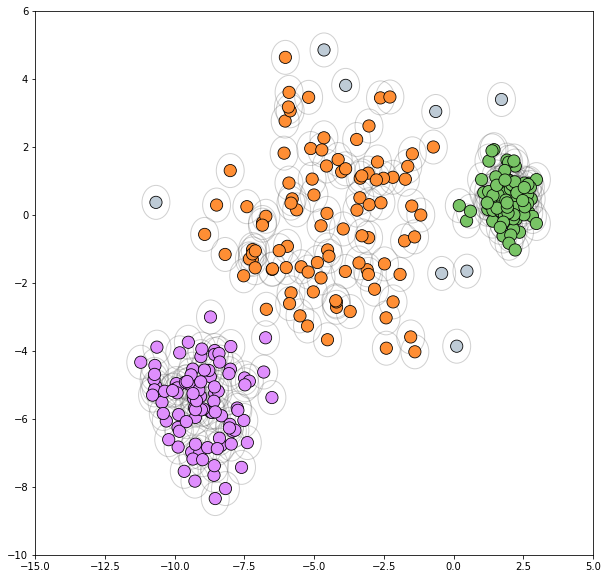

In [9]:
# scenario 1
epsilon = 1.3
dbscan = DBSCAN(eps=epsilon)
clustering_labels_4 = dbscan.fit_predict(dataset_2)

helper.plot_clustered_dataset(dataset_2, clustering_labels_4, neighborhood=True, xlim=(-15, 5), ylim=(-10,6))

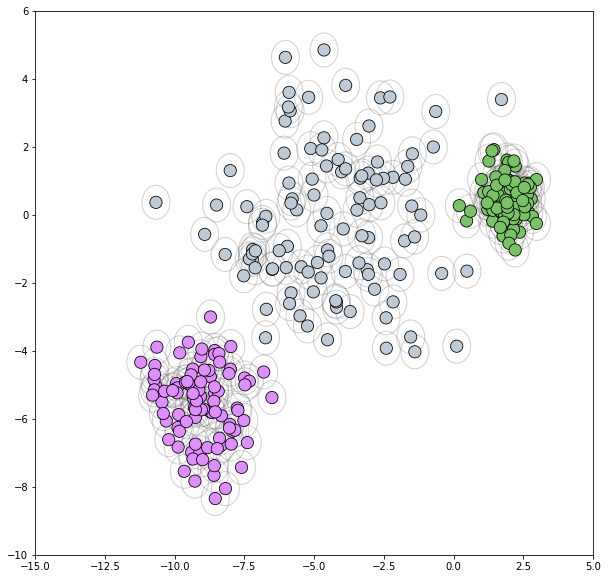

In [12]:
# scenario 2
epsilon = 1.3
min_samples = 20
dbscan = DBSCAN(eps=epsilon, min_samples=min_samples)
clustering_labels_5 = dbscan.fit_predict(dataset_2)

helper.plot_clustered_dataset(dataset_2, clustering_labels_5, neighborhood=True, xlim=(-15, 5), ylim=(-10,6))

The following grid plots the DBSCAN clustering results of a range of parameter values. Epsilon varies horizontally, while vertically each row shows a different value of min_samples.

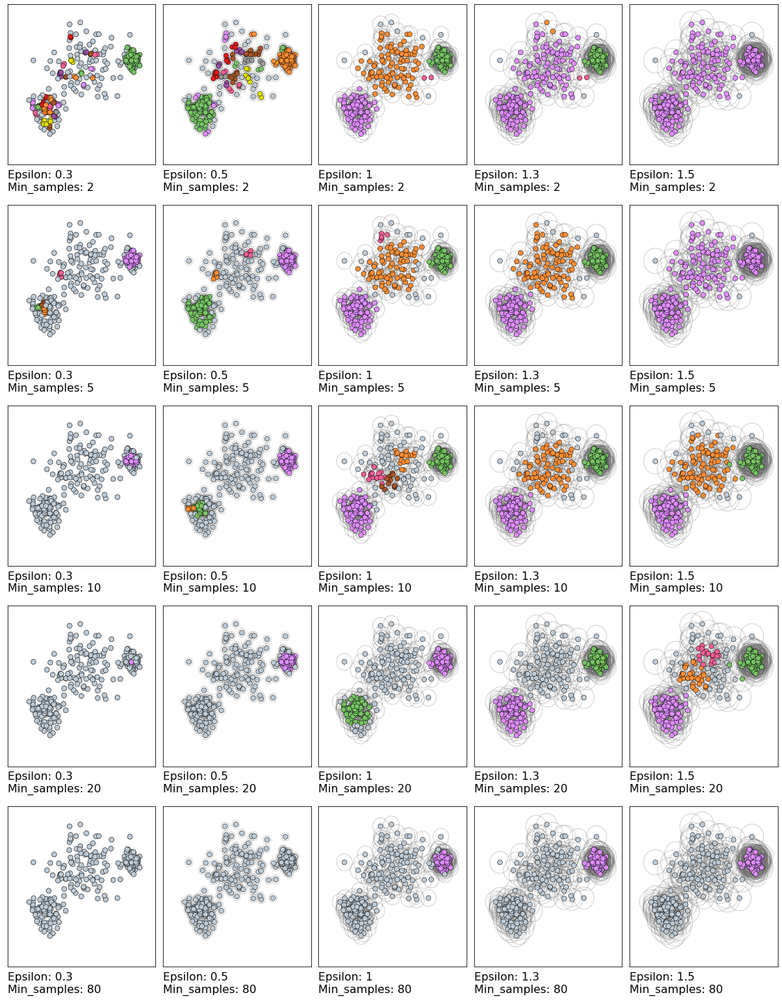

In [11]:
eps_values = [0.3, 0.5, 1, 1.3, 1.5]
min_samples_values = [2, 5, 10, 20, 80]

helper.plot_dbscan_grid(dataset_2, eps_values, min_samples_values)

## Heuristics for experimenting with DBSCAN's parameters
Looking at this grid, we can guess at some general heuristics for tweaking the parameters of DBSCAN:

| |Epsilon too low|Epsilon too high|
|---|---|---|---|
|**min_samples too low** |<center><img src='images/low_epsilon_and_low_min_sample.png'></center><br>Many small clusters. More than anticipated for the dataset. <br>**Action**: increase min_samples and epsilon| <center><img src='images/high_epsilon_and_low_min_sample.png'></center><br>Most points belong to one cluster<br>**Action**: decrease epsilon and increase min_samples|
|**min_samples too high**|<center><img src='images/low_epsilon_and_high_min_sample.png'></center><br>Most/all data points are labeled as noise<br>**Action**: increase epsilon and decrease min_sample| <center><img src='images/high_epsilon_and_high_min_sample.png'></center><br> Except for extremely dense regions, most/all data points are <br>labeled as noise. (Or all points are labeled as noise). <br>**Action**: decrease min_samples and epsilon.|

### Quiz
* Which values do you believe best satisfy scenario 1? Epsilon=1.5, min_samples=10
* Which values do you believe best satisfy scenario 2? Epsilon=1.3, min_samples=20